# Lab 1 — Python and OpenCV Tutorial (Updated)

## Goal and classroom route

Learn how an image becomes an array, how to extract a colored region, and how
to apply camera calibration, stereo matching, and image stitching.

**New activity:** §2.2.3 Improve Local Contrast with CLAHE, a 5-minute demonstration
of `cv2.createCLAHE()` using a simulated low-contrast version of `Lenna.png`.

**Run order:** execute cells from top to bottom. For the new activity alone,
run Step0 to download the demonstration image, then the two code cells in
§2.2.3. A CPU runtime is sufficient.

**Setup:** open this notebook in Google Colab and run the cells from top to
bottom. A CPU runtime is sufficient. The examples use OpenCV, NumPy,
Matplotlib, and requests. If an import fails, run
`%pip install opencv-contrib-python-headless numpy matplotlib requests`,
restart the runtime if requested, then rerun the notebook. The example images
are downloaded automatically; internet access is needed on their first run.

**Checks:** inspect array shapes, binary masks, calibration RMS, disparity
units, and RANSAC inliers. A visually attractive result is not proof of accuracy.

**Next steps:** see the [Lab Report](https://romi-lab.github.io/python_opencv/index.html#lab-report-content) for the individual report.
Q1–Q3 require your own photographs taken on the PolyU Hung Hom campus.
Q4 uses a printed checkerboard for calibration; Q5 requires a full horizontal
360° panorama at an assigned campus location. Q6 is perspective correction,
and Q7 is analysis.

This copy preserves the original lesson sequence and adds one teaching activity.


## Python Basis



This file - an IPython notebook -  does not follow the standard pattern with Python code in a text file. Instead, an IPython notebook is stored as a file in the [JSON](http://en.wikipedia.org/wiki/JSON) format. The advantage is that we can mix formatted text, Python code and code output. It requires the IPython notebook server to run it though, and therefore isn't a stand-alone Python program. Other than that, there is no difference between the Python code that goes into a program file or an IPython notebook.



### 1.1 Modules
Most of the functionality in Python is provided by *modules*. The Python Standard Library is a large collection of modules that provides *cross-platform* implementations of common facilities such as access to the operating system, file I/O, string management, network communication, and much more.

To use a module in a Python program it first has to be imported. A module can be imported using the `import` statement. For example, to import the module `cv2`, which contains computer vision and image processing functions, we can do:

In [1]:
import cv2

This includes the whole module and makes it available for use later in the program. We can also use other methods for importing the module:

In [2]:
from cv2 import *
from cv2 import aruco

Looking at what a module contains, and its documentation

In [3]:
import math

print(dir(math))

['__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'acos', 'acosh', 'asin', 'asinh', 'atan', 'atan2', 'atanh', 'cbrt', 'ceil', 'comb', 'copysign', 'cos', 'cosh', 'degrees', 'dist', 'e', 'erf', 'erfc', 'exp', 'exp2', 'expm1', 'fabs', 'factorial', 'floor', 'fmod', 'frexp', 'fsum', 'gamma', 'gcd', 'hypot', 'inf', 'isclose', 'isfinite', 'isinf', 'isnan', 'isqrt', 'lcm', 'ldexp', 'lgamma', 'log', 'log10', 'log1p', 'log2', 'modf', 'nan', 'nextafter', 'perm', 'pi', 'pow', 'prod', 'radians', 'remainder', 'sin', 'sinh', 'sqrt', 'sumprod', 'tan', 'tanh', 'tau', 'trunc', 'ulp']


Also you can check the description of each function

In [4]:
help(math.log)

Help on built-in function log in module math:

log(...)
    log(x, [base=math.e])
    Return the logarithm of x to the given base.

    If the base is not specified, returns the natural logarithm (base e) of x.



### 1.2 Variable

In [5]:
# integers
x = 1
type(x)

int

In [6]:
# float
x = 1.0
type(x)

float

In [7]:
# boolean
b1 = True
b2 = False

type(b1)

bool

In [8]:
# complex numbers: note the use of `j` to specify the imaginary part
x = 1.0 - 1.0j
type(x)
print(x)
print(x.real, x.imag)

(1-1j)
1.0 -1.0


### 1.3 Operators and comparisons

In [9]:
1 + 2, 1 - 2, 1 * 2, 1 / 2

(3, -1, 2, 0.5)

In [10]:
1.0 + 2.0, 1.0 - 2.0, 1.0 * 2.0, 1.0 / 2.0

(3.0, -1.0, 2.0, 0.5)

In [11]:
# Integer division of float numbers
3.0 // 2.0

1.0

In [12]:
# Note! The power operators in python isn't ^, but **
2 ** 2

4

In [13]:
True and False

False

### 1.4 Compound types: Strings, List

Strings are the variable type that is used for storing text messages.

In [14]:
s = "Hello world"
type(s)

str

In [15]:
# length of the string: the number of characters
len(s)

11

In [16]:
# replace a substring in a string with something else
s2 = s.replace("world", "test")
print(s2)

Hello test


In [17]:
# We can index a character in a string using []:
s[0]

'H'

We can extract a part of a string using the syntax `[start:stop]`, which extracts characters between index `start` and `stop` -1 (the character at index `stop` is not included):

In [18]:
s[0:5]
s[4:5]

'o'

If we omit either (or both) of start or stop from [start:stop], the default is the beginning and the end of the string, respectively:

In [19]:
s[:5]
s[6:]
s[:]

'Hello world'

We can also define the step size using the syntax [start:end:step] (the default value for step is 1, as we saw above):

In [20]:
s[::1]
s[::2]

'Hlowrd'

String formatting examples

In [21]:
print("str1", "str2", "str3")  # The print statement concatenates strings with a space
print("str1", 1.0, False, -1j)  # The print statements converts all arguments to strings
print("str1" + "str2" + "str3") # strings added with + are concatenated without space
print("value = %f" % 1.0)       # we can use C-style string formatting

str1 str2 str3
str1 1.0 False (-0-1j)
str1str2str3
value = 1.000000


In [22]:
# this formatting creates a string
s2 = "value1 = %.2f. value2 = %d" % (3.1415, 1.5)

print(s2)

value1 = 3.14. value2 = 1


In [23]:
# alternative, more intuitive way of formatting a string
s3 = 'value1 = {0}, value2 = {1}'.format(3.1415, 1.5)

print(s3)

value1 = 3.1415, value2 = 1.5


List

Lists are very similar to strings, except that each element can be of any type.

In [24]:
# creating lists
l = [1,2,3,4]

print(type(l))
print(l)

<class 'list'>
[1, 2, 3, 4]


In [25]:
# slicing
print(l)

print(l[1:3])

print(l[::2])

[1, 2, 3, 4]
[2, 3]
[1, 3]


Elements in a list do not all have to be of the same type:

In [26]:
l = [1, 'a', 1.0, 1-1j]

print(l)

[1, 'a', 1.0, (1-1j)]


Python lists can be inhomogeneous and arbitrarily nested:

In [27]:
nested_list = [1, [2, [3, [4, [5]]]]]

nested_list

[1, [2, [3, [4, [5]]]]]

In [28]:
# range function for lists:
start = 10
stop = 30
step = 2

range(start, stop, step)

range(10, 30, 2)

In [29]:
# In Python 3, range is a compact, iterable sequence; list materializes its values.
list(range(start, stop, step))


[10, 12, 14, 16, 18, 20, 22, 24, 26, 28]

In [30]:
list(range(-10, 10))

[-10, -9, -8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

Adding, inserting, modifying, and removing elements from lists

In [31]:
# create a new empty list
l = []

# add an elements using `append`
l.append("A")
l.append("d")
l.append("d")

print(l)

['A', 'd', 'd']


In [32]:
l[1] = "p"
l[2] = "p"

print(l)

['A', 'p', 'p']


In [33]:
l.insert(0, "i")
l.insert(1, "n")
l.insert(2, "s")
l.insert(3, "e")
l.insert(4, "r")
l.insert(5, "t")

print(l)

['i', 'n', 's', 'e', 'r', 't', 'A', 'p', 'p']


In [34]:
# Remove first element with specific value using 'remove'
l.remove("A")

print(l)
# Remove an element at a specific location using del:
del l[4]
del l[3]

print(l)

['i', 'n', 's', 'e', 'r', 't', 'p', 'p']
['i', 'n', 's', 't', 'p', 'p']


### 1.5 Loops

1. `for` loops

In Python, loops can be programmed in a number of different ways. The most common is the for loop, which is used together with iterable objects, such as lists. The basic syntax is:

In [35]:
for x in [1,2,3]:
    print(x)

1
2
3


In [36]:
for x in range(4): # by default range start at 0
    print(x)

0
1
2
3


In [37]:
for x in range(-3,3):
    print(x)

-3
-2
-1
0
1
2


In [38]:
for word in ["scientific", "computing", "with", "python"]:
    print(word)

scientific
computing
with
python


Creating lists using `for` loops:

In [39]:
l1 = [x**2 for x in range(0,5)]

print(l1)

[0, 1, 4, 9, 16]


2. `while` loops

In [40]:
i = 0

while i < 5:
    print(i)

    i = i + 1

print("done")

0
1
2
3
4
done


### 1.6 Functions

A function in Python is defined using the keyword `def`, followed by a function name, a signature within parentheses `()`, and a colon `:`. The following code, with one additional level of indentation, is the function body.

In [41]:
def func0():
    print("test")
func0()

test


Functions that returns a value use the `return` keyword:

In [42]:
def square(x):
    """
    Return the square of x.
    """
    return x ** 2

In [43]:
square(4)

16

We can return multiple values from a function using tuples (see above):

In [44]:
def powers(x):
    """
    Return a few powers of x.
    """
    return x ** 2, x ** 3, x ** 4

In [45]:
powers(3)

(9, 27, 81)

In [46]:
x2, x3, x4 = powers(3)

print(x3)

27


Unnamed functions (lambda function)

In [47]:
f1 = lambda x: x**2

# is equivalent to

def f2(x):
    return x**2

In [48]:
f1(2), f2(2)

(4, 4)

### 1.7 Classes

Classes are the key features of object-oriented programming. A class is a structure for representing an object and the operations that can be performed on the object.

In Python a class can contain *attributes* (variables) and *methods* (functions).

A class is defined almost like a function, but using the `class` keyword, and the class definition usually contains a number of class method definitions (a function in a class).

* Each class method should have an argument `self` as its first argument. This object is a self-reference.

* Some class method names have special meaning, for example:

    * `__init__`: The name of the method that is invoked when the object is first created.
    * `__str__` : A method that is invoked when a simple string representation of the class is needed, as for example when printed.

In [49]:
class Point:
    """
    Simple class for representing a point in a Cartesian coordinate system.
    """

    def __init__(self, x, y):
        """
        Create a new Point at x, y.
        """
        self.x = x
        self.y = y

    def translate(self, dx, dy):
        """
        Translate the point by dx and dy in the x and y direction.
        """
        self.x += dx
        self.y += dy

    def __str__(self):
        return("Point at [%f, %f]" % (self.x, self.y))

To create a new instance of a class:

In [50]:
p1 = Point(0, 0) # this will invoke the __init__ method in the Point class

print(p1)         # this will invoke the __str__ method

Point at [0.000000, 0.000000]


To invoke a class method in the class instance `p`:

In [51]:
p2 = Point(1, 1)

p1.translate(0.25, 1.5)

print(p1)
print(p2)

Point at [0.250000, 1.500000]
Point at [1.000000, 1.000000]


## 2. OpenCV Basis

- OpenCV was started at Intel in 1999 by **Gary Bradski**, and the first release came out in 2000.
- OpenCV now supports a multitude of algorithms related to Computer Vision and Machine Learning and is expanding day by day

## OpenCV-Python
- OpenCV-Python is a library of Python bindings designed to solve computer vision problems.

- All the OpenCV array structures are converted to and from NumPy arrays.**Proficiency with Numpy is a must in order to write optimized code using OpenCV-Python.**

- This also makes it easier to integrate with other libraries that use NumPy such as
SciPy and Matplotlib.

### 2.1 Installation of OpenCV-Python

**In this google colab tutorial, the language is python-based and check the imports first and use the setup instructions above if a dependency is missing.**

If you want to install on your computer afterclass. You can follow the steps:

- Activate your virtual environment (virtualenv, Conda, etc.)
- Install:
```bash
pip install opencv-contrib-python
pip install numpy
```
- Check installation:
```bash
python3
>>>import cv2
>>>print(cv2.__version__)
```

### 2.2 Basis of OpenCV
In this section, this tutorial will firstly introduce the `Numpy` module as it's the essential component of processing opencv-python data. Then it will introduce the basic usage of opencv through some simple examples. Finally, I will give the opencv implementation of camera calibration, disparity map, image stitching, rectification.


#### 2.2.1 Numpy
NumPy is a fundamental package for scientific computing in Python. It provides support for large, multi-dimensional arrays and matrices, along with a collection of mathematical functions to operate on these arrays efficiently.

Start with importing the module

In [52]:
import numpy as np

Creating NumPy Arrays from Python Lists

In [53]:
# 1D array
arr1d = np.array([1, 2, 3, 4, 5])
print("1D array:", arr1d)

# 2D array
arr2d = np.array([[1, 2, 3], [4, 5, 6]])
print("2D array:\n", arr2d)

# Using numpy build-in functions to create
# Create an array of zeros
zeros = np.zeros((3, 3))
print("Array of zeros:\n", zeros)

# Create an array of ones
ones = np.ones((2, 4))
print("Array of ones:\n", ones)

# Create an array with a range of values
range_arr = np.arange(0, 10, 2)
print("Range array:", range_arr)

1D array: [1 2 3 4 5]
2D array:
 [[1 2 3]
 [4 5 6]]
Array of zeros:
 [[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
Array of ones:
 [[1. 1. 1. 1.]
 [1. 1. 1. 1.]]
Range array: [0 2 4 6 8]


Array Operations

Basic Operations

In [54]:
a = np.array([1, 2, 3])
b = np.array([4, 5, 6])

# Addition
print("a + b =", a + b)

# Multiplication
print("a * b =", a * b)

# Scalar multiplication
print("2 * a =", 2 * a)

a + b = [5 7 9]
a * b = [ 4 10 18]
2 * a = [2 4 6]


Array Indexing and Slicing

In [55]:
arr = np.array([[1, 2, 3, 4], [5, 6, 7, 8], [9, 10, 11, 12]])
print("Original array:\n", arr)

# Indexing
print("Element at (1, 2):", arr[1, 2])

# Slicing
print("First two rows, last two columns:\n", arr[:2, 2:])

Original array:
 [[ 1  2  3  4]
 [ 5  6  7  8]
 [ 9 10 11 12]]
Element at (1, 2): 7
First two rows, last two columns:
 [[3 4]
 [7 8]]


Array Attributes

In [56]:
# Shape of the array
print("Shape:", arr.shape)

# Number of dimensions
print("Dimensions:", arr.ndim)

# Data type of the array
print("Data type:", arr.dtype)

Shape: (3, 4)
Dimensions: 2
Data type: int64


Mathematical Operations

In [57]:
# Sum of all elements
print("Sum of all elements:", np.sum(arr))

# Mean of the array
print("Mean of the array:", np.mean(arr))

# Maximum value
print("Maximum value:", np.max(arr))

Sum of all elements: 78
Mean of the array: 6.5
Maximum value: 12


Reshaping Arrays

In [58]:
reshaped = arr.reshape(2, 6)
print("Reshaped array:\n", reshaped)

Reshaped array:
 [[ 1  2  3  4  5  6]
 [ 7  8  9 10 11 12]]


Broadcasting: NumPy can align compatible array shapes for elementwise operations.

In [59]:
a = np.array([[1, 2, 3], [4, 5, 6]])
b = np.array([10, 20, 30])

print("a + b:\n", a + b)

a + b:
 [[11 22 33]
 [14 25 36]]


#### 2.2.2 OpenCV Basic Usage

**Step0 (Must run!!!): Import the opencv module and test images**

In [60]:
import cv2  # opencv for python package
import matplotlib.pyplot as plt
import numpy as np

figsize = (10, 10)

In [61]:
from pathlib import Path
import requests

def download_image(url, destination):
    destination = Path(destination)
    if destination.exists() and cv2.imread(str(destination)) is not None:
        return destination
    response = requests.get(url, timeout=60)
    response.raise_for_status()
    pixels = cv2.imdecode(np.frombuffer(response.content, np.uint8), cv2.IMREAD_COLOR)
    if pixels is None:
        raise ValueError(f"Downloaded file is not a readable image: {url}")
    destination.parent.mkdir(parents=True, exist_ok=True)
    destination.write_bytes(response.content)
    return destination

IMAGE_BASE = "https://raw.githubusercontent.com/gongguhit/Perceptual_Robotics_learn_opencv/master/imgs/"
for filename in ["Lenna.png", "opencv_logo.png", "masking1.png", "masking2.png"]:
    download_image(IMAGE_BASE + filename, filename)
print("Basic example images are ready.")


Basic example images are ready.


Read an image and show

In [62]:
img = cv2.imread("Lenna.png")
if img is None:
    raise FileNotFoundError("Run the image download cell first.")


In this colab ipynb, we prefer to use module `matplotlib` for visualization to avoid the unexpected error of `cv2.imshow()`.



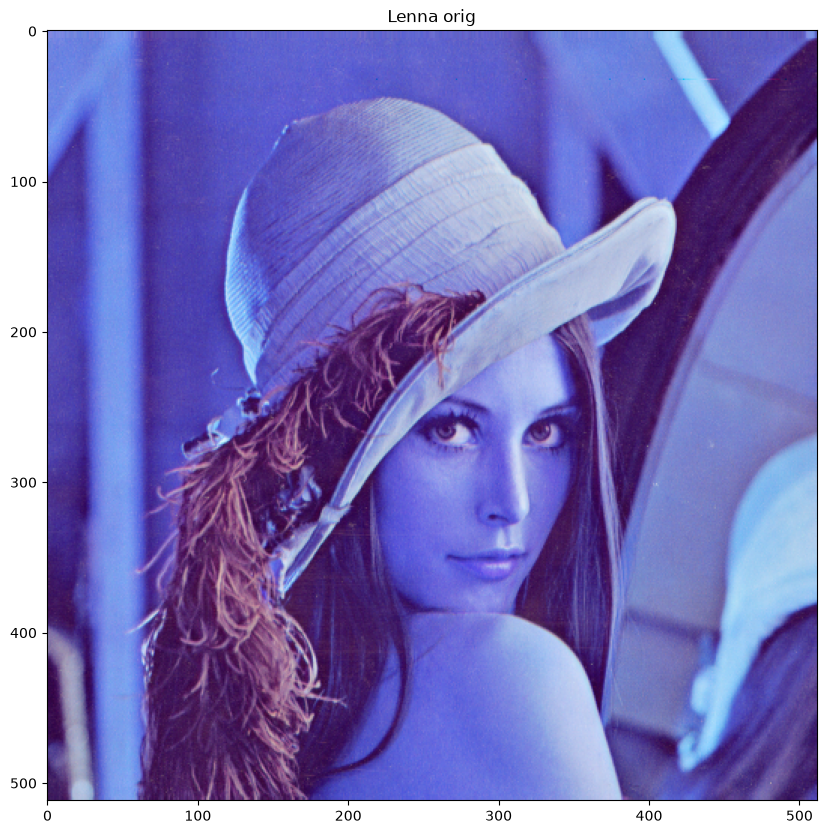

In [63]:
plt.figure(figsize=figsize)
plt.imshow(img)
plt.title("Lenna orig")
plt.show()

We got a weird image colors... This is because OpenCV uses image reading convention of BGR and matplotlib uses RGB.

The fix is easy:

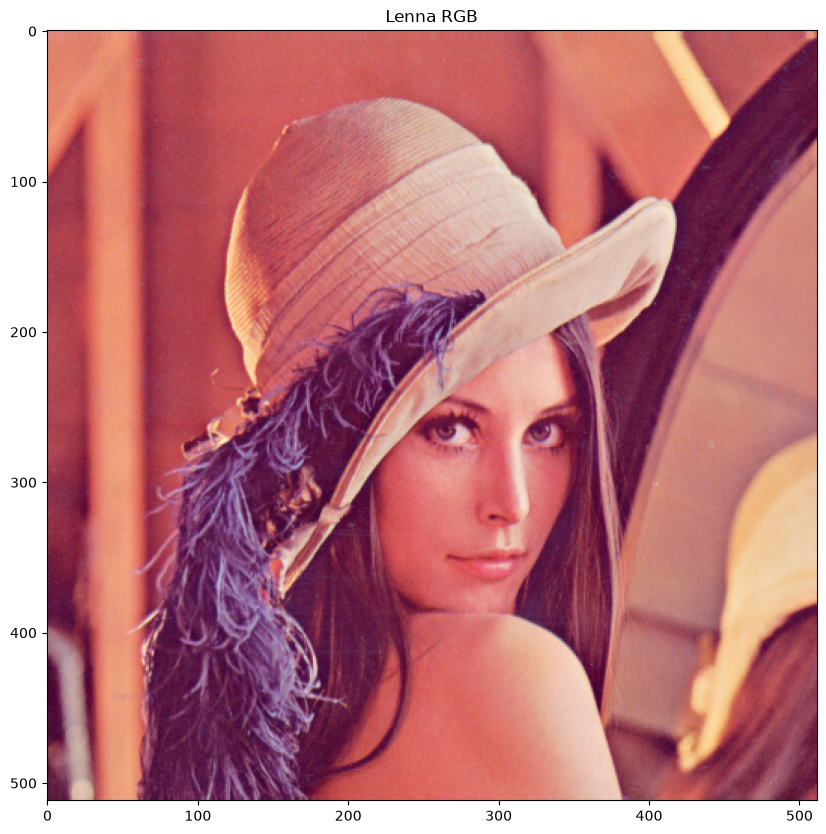

In [64]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=figsize)
plt.imshow(img)
plt.title("Lenna RGB")
plt.show()


In [65]:
# some image info:
print(type(img))
print(img.shape)
img

<class 'numpy.ndarray'>
(512, 512, 3)


array([[[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       ...,

       [[ 84,  18,  60],
        [ 84,  18,  60],
        [ 92,  27,  58],
        ...,
        [173,  73,  84],
        [172,  68,  76],
        [177,  62,  79]],

       [[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]],

       [[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]]

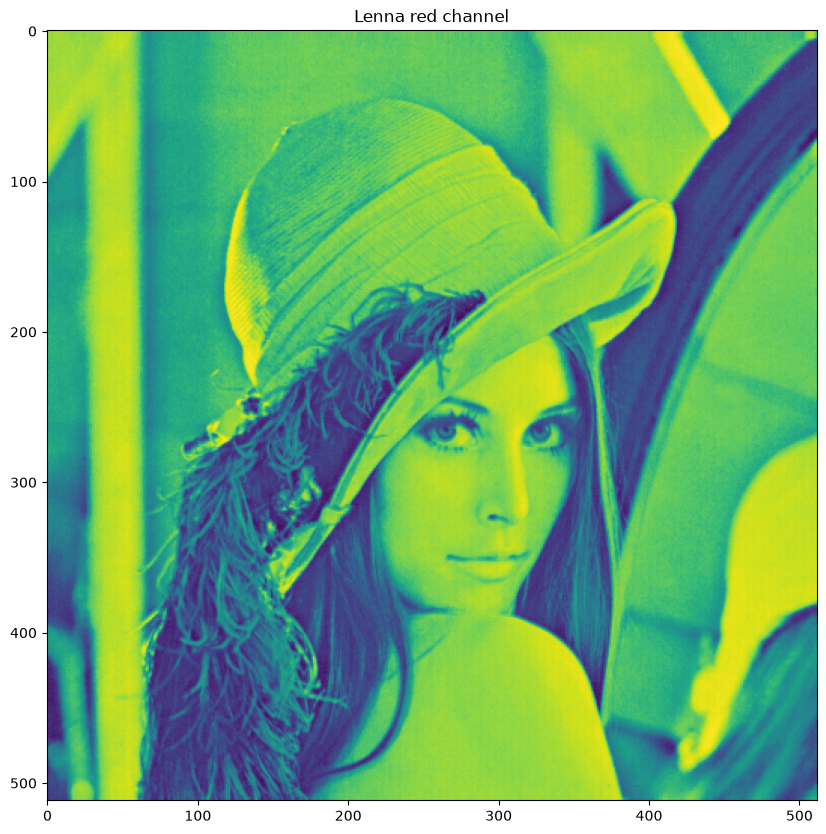

In [66]:
# show only red channel
plt.figure(figsize=figsize)
plt.imshow(img[:, :, 0])
plt.title("Lenna red channel")
plt.show()

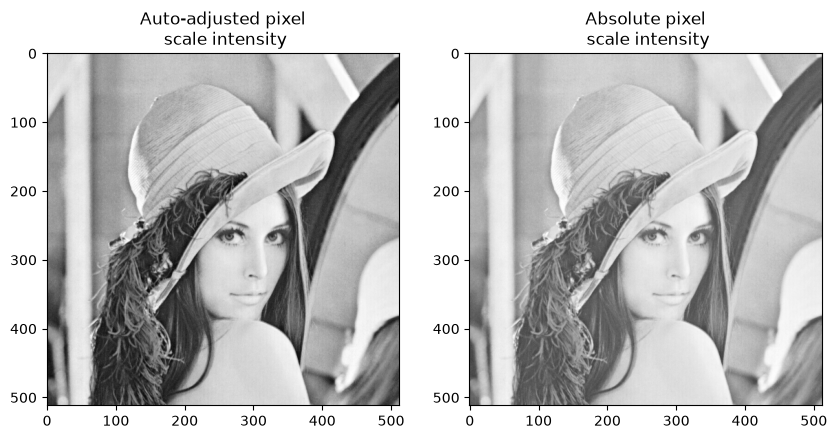

In [67]:
# gray color-mapping
fig, ax_arr = plt.subplots(1, 2, figsize=figsize)

ax_arr[0].imshow(img[:, :, 0], cmap="gray")
ax_arr[0].set_title("Auto-adjusted pixel\n scale intensity")

ax_arr[1].imshow(
    img[:, :, 0], cmap="gray", vmin=0, vmax=255
)  # 255 is the max of uint8 type number (== 2**8 -1)
ax_arr[1].set_title("Absolute pixel\n scale intensity")
plt.show()

We can apply more advanced functions

Image blur

- Gaussian Blurring:
  - blurring an image by a Gaussian function. It is a widely used effect in graphics software, typically to reduce image noise and reduce detail.
  - It is also used as a preprocessing stage before applying our machine learning or deep learning models.
- Median Blur:
  - a non-linear digital filtering technique, often used to remove noise from an image or signal. Median filtering is very widely used in digital image processing because, under certain conditions, it preserves edges while removing noise.
  - It is one of the best algorithms to remove Salt and pepper noise.
- Bilateral Blur:
  - a non-linear, edge-preserving, and noise-reducing smoothing filter for images. It replaces the intensity of each pixel with a weighted average of intensity values from nearby pixels. Thus, sharp edges are preserved while discarding the weak ones.

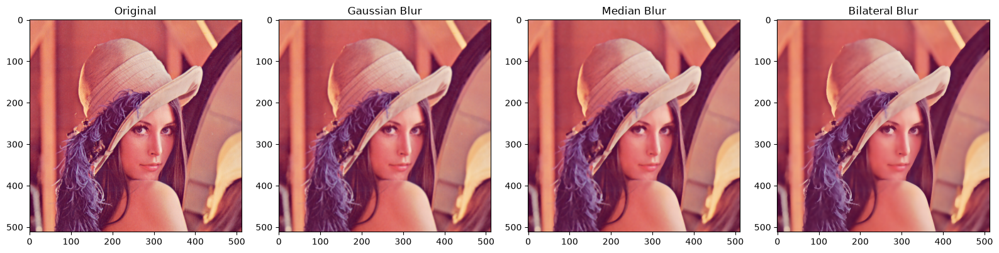

In [68]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread('Lenna.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Gaussian Blur
gaussian_blur = cv2.GaussianBlur(img, (5, 5), 0)

# Median Blur
median_blur = cv2.medianBlur(img, 5)

# Bilateral Blur
bilateral_blur = cv2.bilateralFilter(img, 9, 75, 75)

# Display the results
plt.figure(figsize=(16, 4))

plt.subplot(141), plt.imshow(img), plt.title('Original')
plt.subplot(142), plt.imshow(gaussian_blur), plt.title('Gaussian Blur')
plt.subplot(143), plt.imshow(median_blur), plt.title('Median Blur')
plt.subplot(144), plt.imshow(bilateral_blur), plt.title('Bilateral Blur')

plt.tight_layout()
plt.show()

Canny edge detection

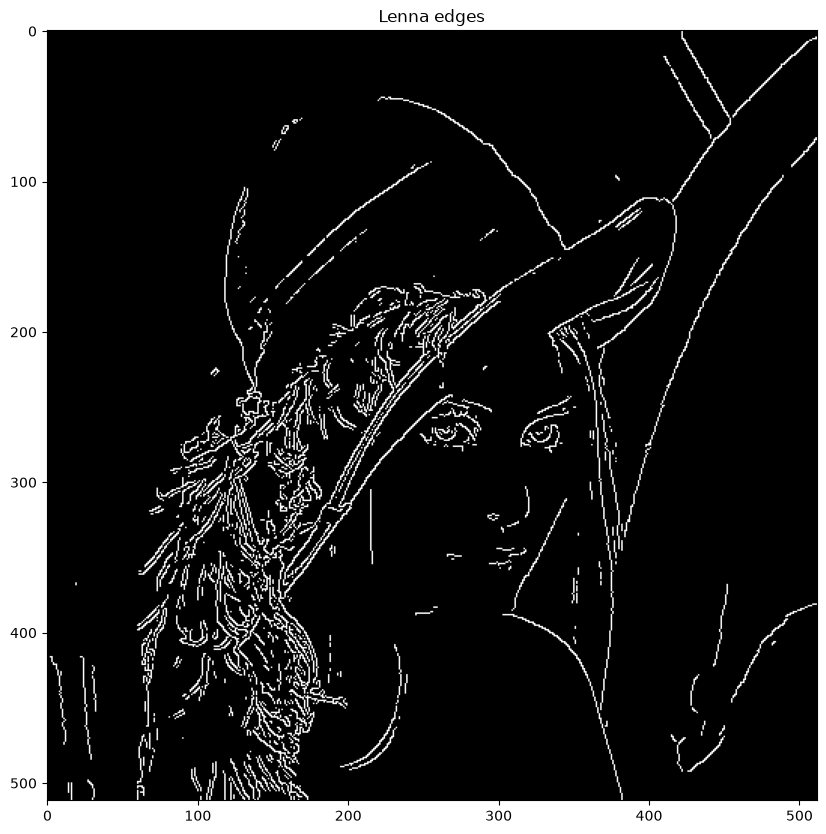

In [69]:
# edge detection
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_canny = cv2.Canny(img_gray, 180, 200)  # end args are the lower & upper TH of hysteresis
plt.figure(figsize=figsize)
plt.imshow(img_canny, cmap="gray")
plt.title("Lenna edges")
plt.show()

In [70]:
help(cv2.Canny)

Help on built-in function Canny:

Canny(...)
    Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]) -> edges
    .   @brief Finds edges in an image using the Canny algorithm @cite Canny86 .
    .
    .   The function finds edges in the input image and marks them in the output map edges using the
    .   Canny algorithm. The smallest value between threshold1 and threshold2 is used for edge linking. The
    .   largest value is used to find initial segments of strong edges. See
    .   <https://en.wikipedia.org/wiki/Canny_edge_detector>
    .
    .   @param image 8-bit input image.
    .   @param edges output edge map; single channels 8-bit image, which has the same size as image .
    .   @param threshold1 first threshold for the hysteresis procedure.
    .   @param threshold2 second threshold for the hysteresis procedure.
    .   @param apertureSize aperture size for the Sobel operator.
    .   @param L2gradient a flag, indicating whether a more accurate \f$L_2

Hough Circle detection

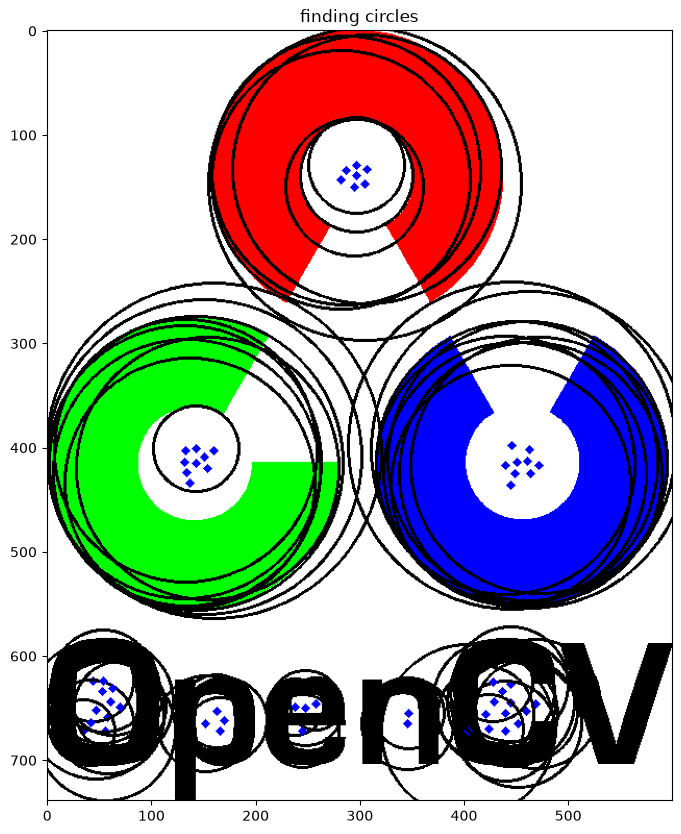

In [71]:
# detect circles

img = cv2.imread("opencv_logo.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

circles = cv2.HoughCircles(img_gray, cv2.HOUGH_GRADIENT, 1.0, 10, param1=20, param2=30)

if circles is None:
    print('No circles found with these parameters.')
for x, y, r in ([] if circles is None else circles[0, :]):
    # draw the outer circle
    cv2.circle(img, (int(x), int(y)), int(r), (0, 0, 0), 2)
    # draw the center of the circle
    cv2.circle(img, (int(x), int(y)), 2, (0, 0, 255), 3)

plt.figure(figsize=figsize)
plt.imshow(img)
plt.title("finding circles")
plt.show()

Image Masking

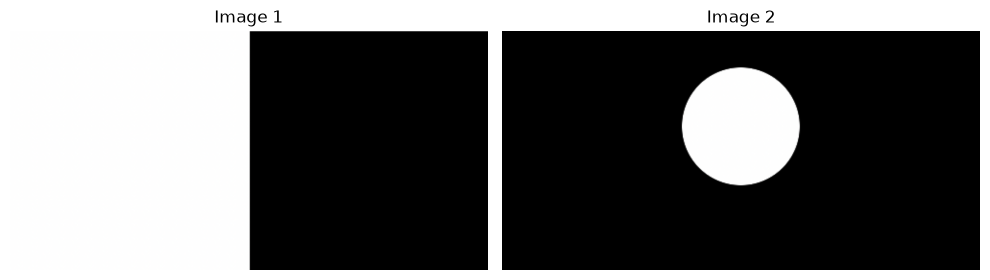

In [72]:
import cv2
import matplotlib.pyplot as plt

# Load the images
img1 = cv2.imread('masking1.png')
img2 = cv2.imread('masking2.png')

img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Display the first image in the first subplot
axs[0].imshow(img1_rgb)
axs[0].set_title('Image 1')
axs[0].axis('off')

# Display the second image in the second subplot
axs[1].imshow(img2_rgb)
axs[1].set_title('Image 2')
axs[1].axis('off')

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

Bitwise AND

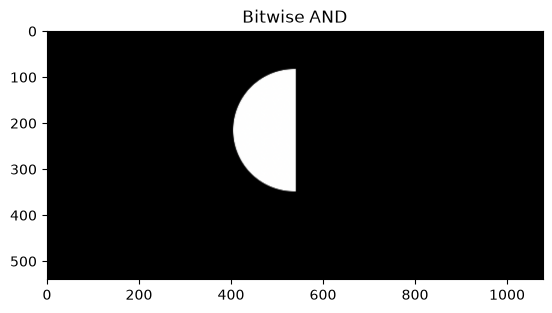

In [73]:
# cv2.bitwise_and is applied over the
# image inputs with applied parameters
dest_and = cv2.bitwise_and(img2, img1, mask = None)
plt.imshow(cv2.cvtColor(dest_and, cv2.COLOR_BGR2RGB))
plt.title("Bitwise AND")
plt.show()

Bitwise OR

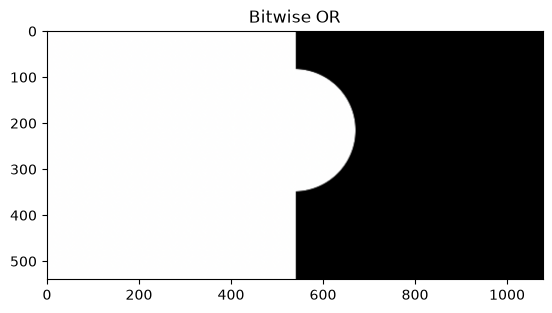

In [74]:
dest_or = cv2.bitwise_or(img2, img1, mask = None)
plt.imshow(cv2.cvtColor(dest_or, cv2.COLOR_BGR2RGB))
plt.title("Bitwise OR")
plt.show()

Bitwise XOR

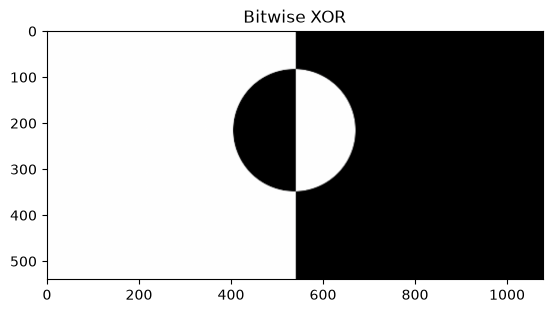

In [75]:
dest_xor = cv2.bitwise_xor(img1, img2, mask = None)
plt.imshow(cv2.cvtColor(dest_xor, cv2.COLOR_BGR2RGB))
plt.title("Bitwise XOR")
plt.show()

Bitwise NOT

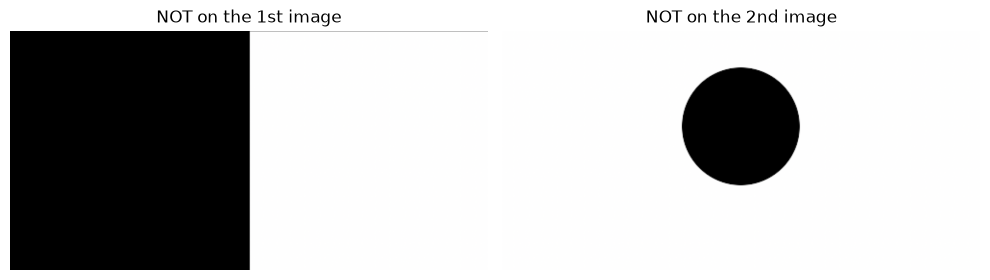

In [76]:
# cv2.bitwise_not is applied over the
# image input with applied parameters
dest_not1 = cv2.bitwise_not(img1, mask  = None)
dest_not2 = cv2.bitwise_not(img2, mask = None)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Display the first image in the first subplot
axs[0].imshow(cv2.cvtColor(dest_not1, cv2.COLOR_BGR2RGB))
axs[0].set_title('NOT on the 1st image')
axs[0].axis('off')

# Display the second image in the second subplot
axs[1].imshow(cv2.cvtColor(dest_not2, cv2.COLOR_BGR2RGB))
axs[1].set_title('NOT on the 2nd image')
axs[1].axis('off')

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

Color Space
- RGB, CMYK, HSV
- HSV:
  - Hue $(H)$ is the basic attribute of color, which is commonly referred to as the color name, such as red, yellow, etc.
  - Saturation $(\mathrm{S})$ refers to the purity of the color, the higher the color, the purer the color, and the lower it will gradually become gray, taking the value of 0-100\%.
  - Brightness (V), take 0-100\%, the higher the brighter.

![HSV](https://raw.githubusercontent.com/gongguhit/Perceptual_Robotics_learn_opencv/master/imgs/HSV.png)
For standard OpenCV **8-bit HSV** images: H = 0–179, S = 0–255, V = 0–255. These are encoded values, not percentages.


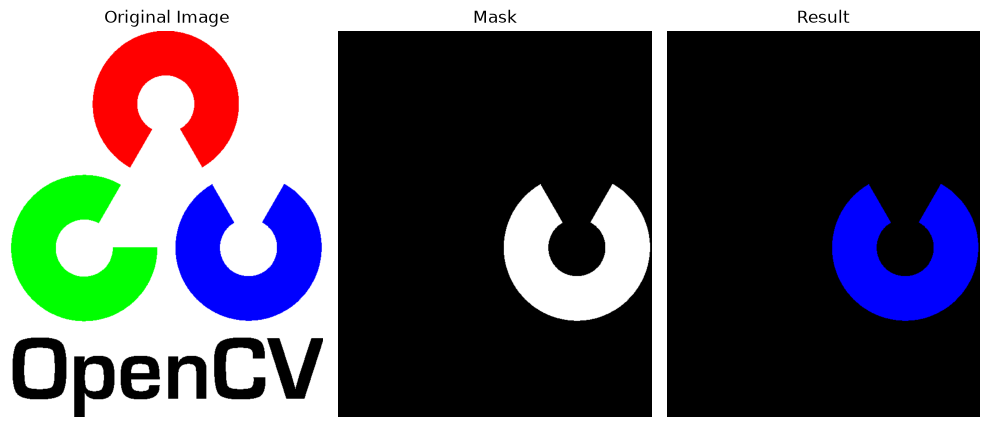

In [77]:
# color filtering

import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('opencv_logo.png')

hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

lower_blue = np.array([100, 80, 50])
upper_blue = np.array([130, 255, 255])

mask = cv2.inRange(hsv, lower_blue, upper_blue)

# Use the mask to obtain the result
result = cv2.bitwise_and(image, image, mask=mask)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

# Mask
plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

# Result
plt.subplot(1, 3, 3)
plt.imshow(result_rgb)
plt.title('Result')
plt.axis('off')

plt.tight_layout()
plt.show()

Find contours
Draw all the contours in the image

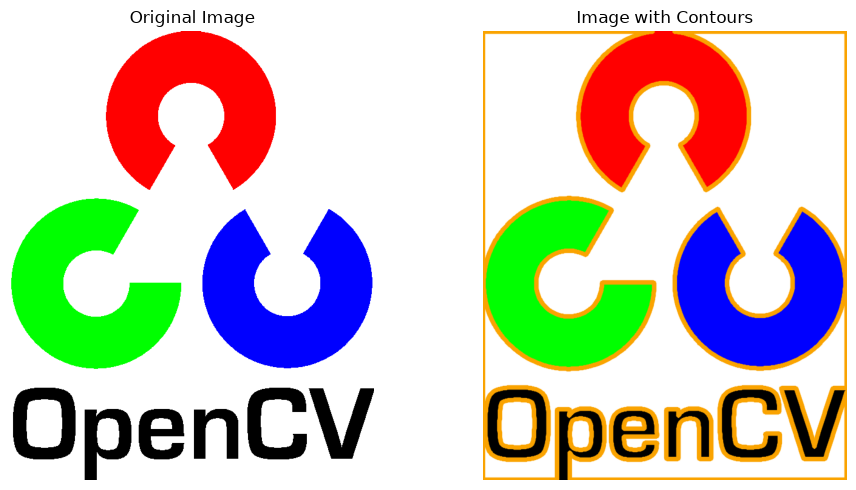

In [78]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('opencv_logo.png')

img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Convert the image to a binary image (black and white only)
_, threshold = cv2.threshold(img_gray, 254, 255, cv2.THRESH_BINARY)

# Detect contours in the image
contours, _ = cv2.findContours(threshold, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
contoured_image = image.copy()
cv2.drawContours(image=contoured_image, contours=contours, contourIdx=-1,
                 color=(0, 163, 250), thickness=5, lineType=cv2.LINE_AA)

# Convert BGR to RGB for displaying with matplotlib
original_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
contoured_rgb = cv2.cvtColor(contoured_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title('Original Image')
plt.axis('off')

# Image with contours
plt.subplot(1, 2, 2)
plt.imshow(contoured_rgb)
plt.title('Image with Contours')
plt.axis('off')

plt.tight_layout()
plt.show()

#### 2.2.3 Improve Local Contrast with CLAHE — new, 5-minute demo

**Engineering problem:** low-contrast camera images can make features and
boundaries difficult to see. Contrast enhancement is a useful preprocessing
candidate before visual inspection, feature extraction, or thresholding.
Its benefit to a downstream algorithm must be measured on that task.

**CLAHE** stands for Contrast Limited Adaptive Histogram Equalization.
It adjusts contrast locally and limits excessive histogram amplification.
We only need two lines:

```python
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
enhanced = clahe.apply(low_contrast)
```

Run **Step0** first. We reuse `Lenna.png` and deliberately compress its
grayscale range to create a **simulated low-contrast input**. This controlled
demonstration is not a real low-light camera experiment.
[OpenCV CLAHE tutorial](https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html)

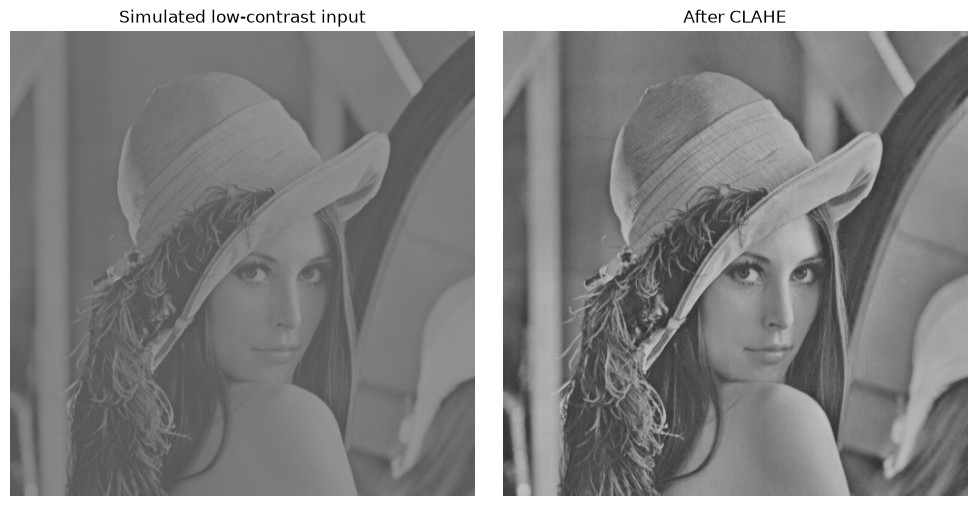

In [79]:
import cv2
import matplotlib.pyplot as plt

reference_gray = cv2.imread("Lenna.png", cv2.IMREAD_GRAYSCALE)
if reference_gray is None:
    raise FileNotFoundError("Run Step0 to download Lenna.png first.")
# Demonstration only: compress the grayscale values into a narrower range.
low_contrast = (0.35 * reference_gray + 70).astype("uint8")

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
enhanced = clahe.apply(low_contrast)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
for ax, picture, title in zip(axes, [low_contrast, enhanced],
                              ["Simulated low-contrast input", "After CLAHE"]):
    ax.imshow(picture, cmap="gray", vmin=0, vmax=255)
    ax.set_title(title)
    ax.axis("off")
plt.tight_layout()
plt.show()


**One small experiment:** keep the input and grid fixed; compare
`clipLimit=2.0` with `clipLimit=8.0`.

- `clipLimit` controls the limit on histogram amplification. A larger
  positive value allows stronger local contrast enhancement.
- `tileGridSize=(8, 8)` means **8 × 8 tiles across the image**, not tiles
  measuring 8 × 8 pixels. Keep this setting fixed for the demonstration.

Use the **same 0–255 display scale** for every image. Automatic rescaling
could hide or exaggerate the differences we are trying to compare.
[OpenCV parameter reference](https://docs.opencv.org/4.x/d6/db6/classcv_1_1CLAHE.html)

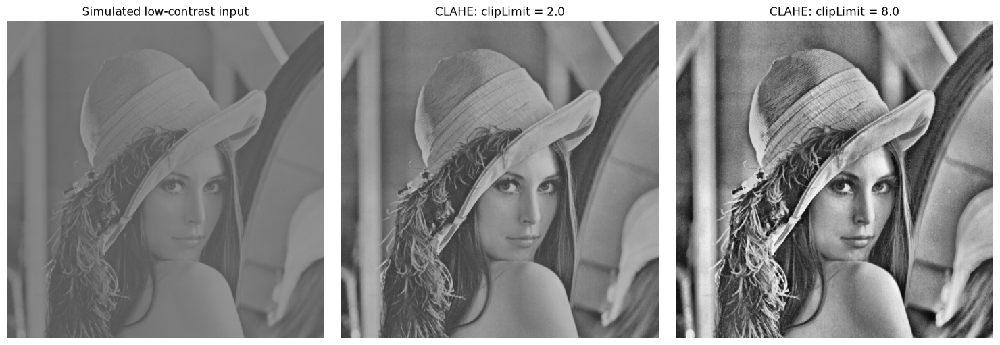

In [80]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(low_contrast, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Simulated low-contrast input")
for ax, clip_limit in zip(axes[1:], [2.0, 8.0]):
    candidate = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=(8, 8))
    result = candidate.apply(low_contrast)
    ax.imshow(result, cmap="gray", vmin=0, vmax=255)
    ax.set_title(f"CLAHE: clipLimit = {clip_limit}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()


**Discuss:** look at the hat texture and the shadowed hair. Which details
are easier to distinguish? Does the stronger setting look over-enhanced?

CLAHE changes the contrast of existing information. It cannot recover
details lost to saturation or motion blur, and it can also amplify noise.
More contrast does not automatically mean better detection accuracy.

The input here is a single-channel 8-bit image. Do not pass a three-channel
BGR image directly to `apply`. To use your own grayscale camera image,
replace `low_contrast` with that image and omit the simulation step.
Optional save: `cv2.imwrite("clahe_result.png", enhanced)`.
This classroom demonstration adds no new report requirement.

### 2.3 Camera Calibration

The intrinsic matrix **K is 3 × 3**; the ideal projection matrix
**P = K[R | t] is 3 × 4**. They are not the same matrix.

Calibration estimates focal lengths and the principal point (in pixels), lens
distortion coefficients, and one board pose per accepted image. Match known
checkerboard coordinates to detected image corners from multiple views.

`pattern_size` counts **inner corners**, not squares. The tutorial's example
scale is for this example; report Q4 uses your measured square size in millimetres.

![intrinsics](https://raw.githubusercontent.com/gongguhit/Perceptual_Robotics_learn_opencv/master/imgs/intrinsics.png)


In [81]:
for i in range(1, 18):
    url = f"https://raw.githubusercontent.com/YoniChechik/AI_is_Math/master/c_07_camera_calibration/images/{i}.jpeg"
    download_image(url, f"calib_images/{i}.jpeg")
print("Calibration images are ready.")


Calibration images are ready.


In [82]:
from glob import glob

import cv2
import matplotlib.pyplot as plt
import numpy as np

In [83]:
# define chessboard parameters
square_size = 2.88  # Tutorial example world units.
img_mask = "./calib_images/*.jpeg"
pattern_size = (9, 6)

figsize = (20, 20)

In [84]:
img_names = sorted(glob(img_mask), key=lambda p: int(Path(p).stem))
if not img_names:
    raise FileNotFoundError('Run the calibration download cell first.')
valid_img_names = []
num_images = len(img_names)

pattern_points = np.zeros((np.prod(pattern_size), 3), np.float32)
pattern_points[:, :2] = np.indices(pattern_size).T.reshape(-1, 2)
pattern_points *= square_size

obj_points = []
img_points = []
h, w = cv2.imread(img_names[0]).shape[:2]

Step1: Find all corners in calibration plane

processing ./calib_images/1.jpeg... 
./calib_images/1.jpeg... OK
processing ./calib_images/2.jpeg... 
./calib_images/2.jpeg... OK
processing ./calib_images/3.jpeg... 
./calib_images/3.jpeg... OK
processing ./calib_images/4.jpeg... 


./calib_images/4.jpeg... OK
processing ./calib_images/5.jpeg... 
./calib_images/5.jpeg... OK
processing ./calib_images/6.jpeg... 
./calib_images/6.jpeg... OK
processing ./calib_images/7.jpeg... 


./calib_images/7.jpeg... OK
processing ./calib_images/8.jpeg... 
./calib_images/8.jpeg... OK
processing ./calib_images/9.jpeg... 
./calib_images/9.jpeg... OK
processing ./calib_images/10.jpeg... 
./calib_images/10.jpeg... OK
processing ./calib_images/11.jpeg... 
./calib_images/11.jpeg... OK
processing ./calib_images/12.jpeg... 


./calib_images/12.jpeg... OK
processing ./calib_images/13.jpeg... 
./calib_images/13.jpeg... OK
processing ./calib_images/14.jpeg... 
./calib_images/14.jpeg... OK
processing ./calib_images/15.jpeg... 
./calib_images/15.jpeg... OK
processing ./calib_images/16.jpeg... 


./calib_images/16.jpeg... OK
processing ./calib_images/17.jpeg... 
./calib_images/17.jpeg... OK


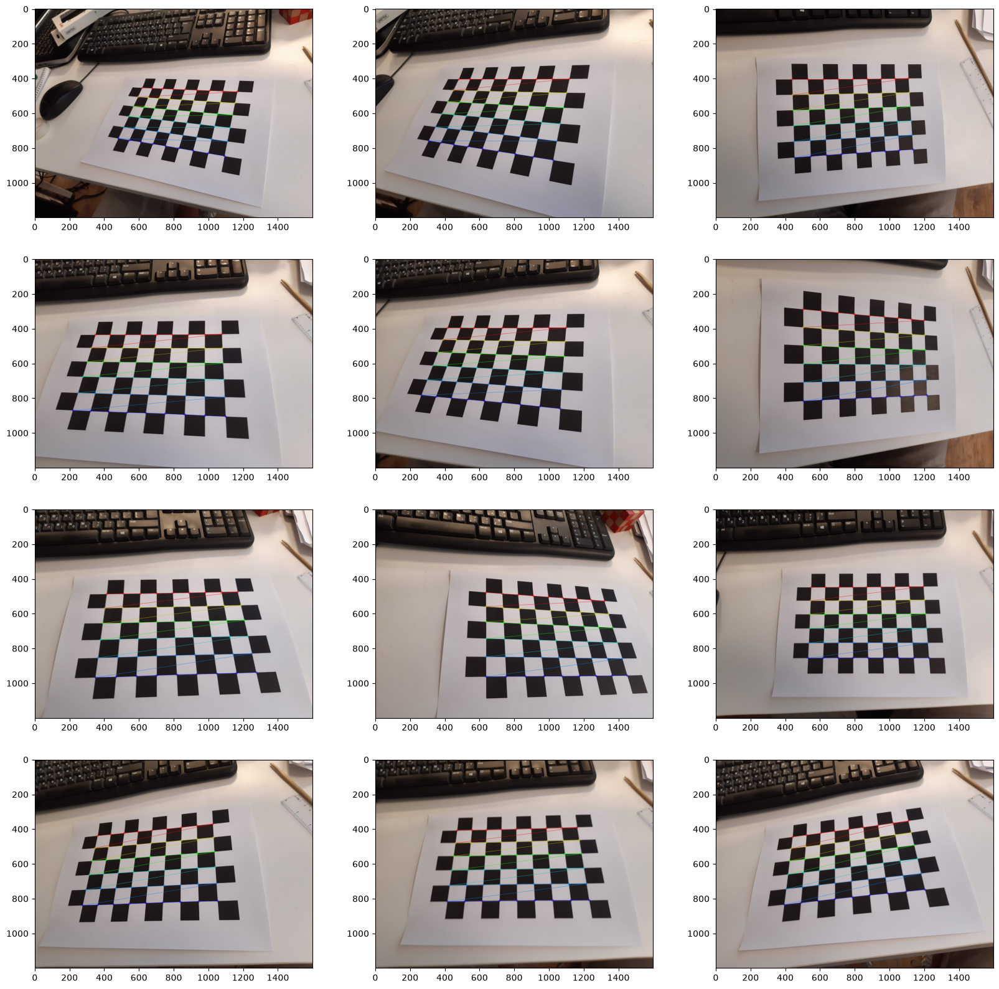

In [85]:
plt.figure(figsize=figsize)

for i, fn in enumerate(img_names):
    print("processing %s... " % fn)
    imgBGR = cv2.imread(fn)

    if imgBGR is None:
        print("Failed to load", fn)
        continue

    imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(imgRGB, cv2.COLOR_RGB2GRAY)

    assert (
        w == img.shape[1] and h == img.shape[0]
    ), f"size: {img.shape[1]} x {img.shape[0]}"
    found, corners = cv2.findChessboardCorners(img, pattern_size)
    if not found:
        print("chessboard not found")
        continue

    term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_COUNT, 30, 0.001)
    corners = cv2.cornerSubPix(img, corners, (5, 5), (-1, -1), term)

    if i < 12:
        img_w_corners = cv2.drawChessboardCorners(imgRGB, pattern_size, corners, found)
        plt.subplot(4, 3, i + 1)
        plt.imshow(img_w_corners)

    print(f"{fn}... OK")
    img_points.append(corners.reshape(-1, 2))
    obj_points.append(pattern_points.copy())
    valid_img_names.append(fn)


plt.show()

Step2: Calculate camera intrinsics and distortion coeffs

In [86]:
if len(obj_points) < 3:
    raise ValueError('Too few detected boards. Check the images and inner-corner count.')
# calculate camera distortion
rms, camera_matrix, dist_coefs, _rvecs, _tvecs = cv2.calibrateCamera(
    obj_points, img_points, (w, h), None, None
)

print("\nRMS:", rms)
print("camera matrix:\n", camera_matrix)
print("distortion coefficients: ", dist_coefs.ravel())


RMS: 0.3962286364998622
camera matrix:
 [[1.24085521e+03 0.00000000e+00 7.87868584e+02]
 [0.00000000e+00 1.24183165e+03 6.13689093e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
distortion coefficients:  [ 1.99799265e-01 -8.01274293e-01 -3.43469047e-04  6.74059301e-04
  9.92964966e-01]


Example for full projection from 3D to 2D of a cube

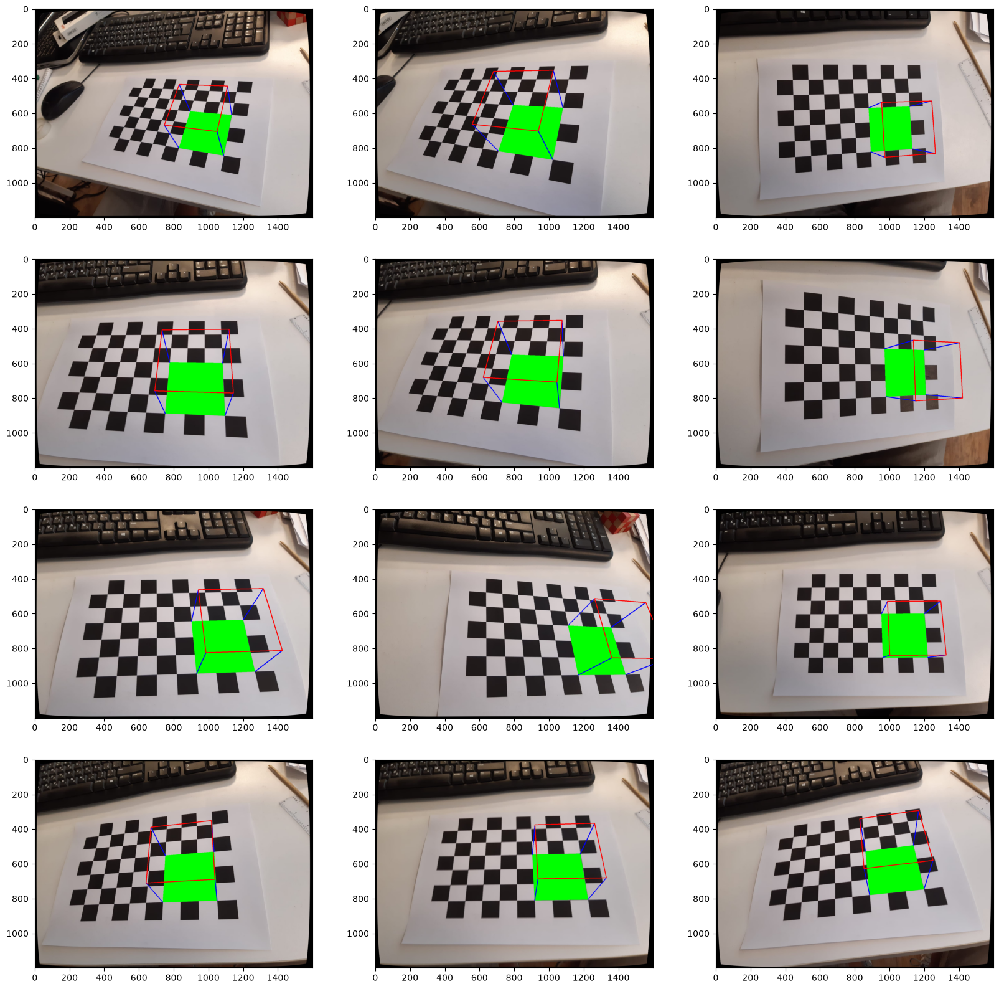

In [87]:
objectPoints = (
    3
    * square_size
    * np.array(
        [
            [0, 0, 0],
            [0, 1, 0],
            [1, 1, 0],
            [1, 0, 0],
            [0, 0, -1],
            [0, 1, -1],
            [1, 1, -1],
            [1, 0, -1],
        ]
    )
)


def draw(img, imgpts):
    imgpts = np.int32(imgpts).reshape(-1, 2)

    # draw ground floor in green
    img = cv2.drawContours(img, [imgpts[:4]], -1, (0, 255, 0), -1)

    # draw pillars in blue color
    for i, j in zip(range(4), range(4, 8)):
        img = cv2.line(img, tuple(imgpts[i]), tuple(imgpts[j]), (0, 0, 255), 3)

    # draw top layer in red color
    img = cv2.drawContours(img, [imgpts[4:]], -1, (255, 0, 0), 3)

    return img


plt.figure(figsize=figsize)
for i, fn in enumerate(valid_img_names):
    imgBGR = cv2.imread(fn)
    imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)

    dst = cv2.undistort(imgRGB, camera_matrix, dist_coefs)

    imgpts = cv2.projectPoints(
        objectPoints, _rvecs[i], _tvecs[i], camera_matrix, np.zeros_like(dist_coefs)
    )[0]  # Draw on an undistorted image, so project with zero distortion.
    drawn_image = draw(dst, imgpts)

    if i < 12:
        plt.subplot(4, 3, i + 1)
        plt.imshow(drawn_image)

plt.show()


### 2.4 Disparity Map

**The basic idea is that two cameras take pictures of the same scene from two different positions, and we aim to estimate the depth for each pixel.** This task can be done by finding matching pixels in the two stereo images and knowing the geometric arrangement of the cameras.

In [88]:
for i in [1, 2]:
    download_image(IMAGE_BASE + f"stereo/view{i}.png", f"disparity_images/{i}.png")
print("Stereo images are ready.")


Stereo images are ready.


In [89]:
help(cv2.StereoSGBM_create)

Help on built-in function StereoSGBM_create:

StereoSGBM_create(...)
    StereoSGBM_create([, minDisparity[, numDisparities[, blockSize[, P1[, P2[, disp12MaxDiff[, preFilterCap[, uniquenessRatio[, speckleWindowSize[, speckleRange[, mode]]]]]]]]]]]) -> retval
    .   @brief Creates StereoSGBM object
    .
    .       @param minDisparity Minimum possible disparity value. Normally, it is zero but sometimes
    .       rectification algorithms can shift images, so this parameter needs to be adjusted accordingly.
    .       @param numDisparities Maximum disparity minus minimum disparity. The value is always greater than
    .       zero. In the current implementation, this parameter must be divisible by 16.
    .       @param blockSize Matched block size. It must be an odd number \>=1 . Normally, it should be
    .       somewhere in the 3..11 range.
    .       @param P1 The first parameter controlling the disparity smoothness. See below.
    .       @param P2 The second parameter control

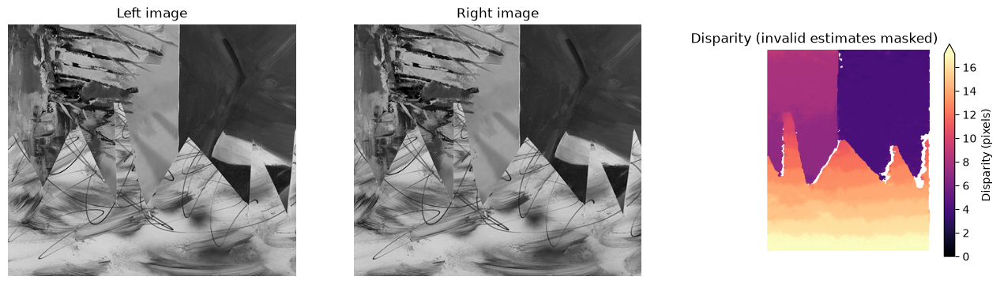

Valid estimates: 69.1%
Display upper limit: 17.12 px (99th percentile; larger values share the top color).
Keep disparity in pixels. A display color is not a depth measurement.


In [90]:
# These supplied images are used as a rectified stereo pair.
left_img = cv2.imread("disparity_images/1.png", cv2.IMREAD_GRAYSCALE)
right_img = cv2.imread("disparity_images/2.png", cv2.IMREAD_GRAYSCALE)
if left_img is None or right_img is None:
    raise FileNotFoundError("Run the stereo download cell first.")
if left_img.shape != right_img.shape:
    raise ValueError("Stereo images must have matching dimensions.")

min_disparity, num_disparities, block_size = 0, 128, 5
stereo = cv2.StereoSGBM_create(
    minDisparity=min_disparity, numDisparities=num_disparities,
    blockSize=block_size,
    P1=8 * block_size**2, P2=32 * block_size**2,  # One grayscale channel.
    disp12MaxDiff=1, uniquenessRatio=10,
    speckleWindowSize=100, speckleRange=2,
)
disparity = stereo.compute(left_img, right_img).astype(np.float32) / 16.0
valid_disparity = disparity > (min_disparity - 1)
display_disparity = np.ma.masked_where(~valid_disparity, disparity)
display_vmax = max(1.0, float(np.percentile(disparity[valid_disparity], 99))) if valid_disparity.any() else num_disparities
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
axes[0].imshow(left_img, cmap="gray"); axes[0].set_title("Left image")
axes[1].imshow(right_img, cmap="gray"); axes[1].set_title("Right image")
plotted = axes[2].imshow(display_disparity, cmap="magma", vmin=0, vmax=display_vmax)
axes[2].set_title("Disparity (invalid estimates masked)")
for ax in axes:
    ax.axis("off")
fig.colorbar(plotted, ax=axes[2], label="Disparity (pixels)", shrink=0.7, extend="max")
plt.show()
print(f"Valid estimates: {valid_disparity.mean():.1%}")
print(f"Display upper limit: {display_vmax:.2f} px (99th percentile; larger values share the top color).")
print("Keep disparity in pixels. A display color is not a depth measurement.")


### 2.5 Image Stitching

This two-image example demonstrates a local planar homography. For report Q5,
analyse one adjacent pair using this workflow, then stitch the full sequence
with cylindrical or spherical projection. You may use
`cv2.Stitcher_create(cv2.Stitcher_PANORAMA)`; see the
[OpenCV stitching guide](https://docs.opencv.org/4.x/d8/d19/tutorial_stitcher.html).
A successful API return does not prove full 360° coverage: check the source
sequence, first-to-last overlap, and wraparound seam.


In [91]:
for i in [1, 2]:
    download_image(IMAGE_BASE + f"stitching/image{i}.jpeg", f"stitch_images/{i}.jpeg")
print("Stitching images are ready.")


Stitching images are ready.


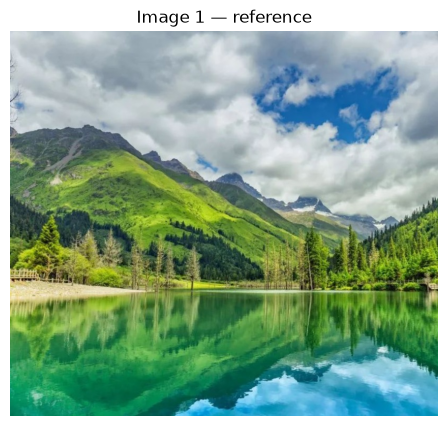

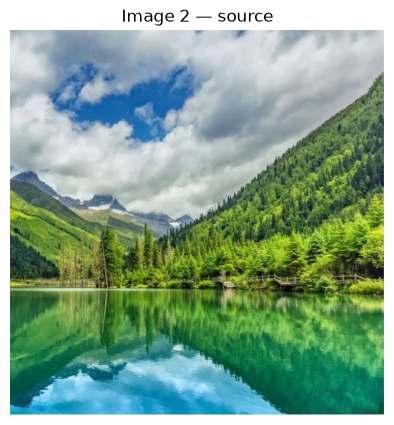

In [92]:
def show_bgr(image, title="Image"):
    plt.figure(figsize=(12, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()

image1 = cv2.imread("stitch_images/1.jpeg")
image2 = cv2.imread("stitch_images/2.jpeg")
if image1 is None or image2 is None:
    raise FileNotFoundError("Run the stitching download cell first.")
show_bgr(image1, "Image 1 — reference")
show_bgr(image2, "Image 2 — source")


H maps image 2 into image 1 coordinates:
 [[1.00007998e+00 1.11768746e-05 3.87997510e+02]
 [3.22465319e-05 1.00004181e+00 9.87906299e-01]
 [1.22318771e-07 1.75550028e-08 1.00000000e+00]]
RANSAC inliers: 100/100


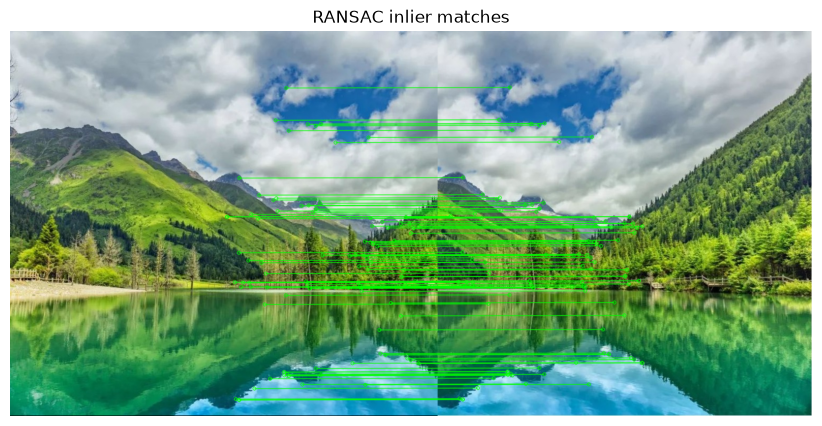

In [93]:
sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY), None)
keypoints2, descriptors2 = sift.detectAndCompute(cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY), None)
if descriptors1 is None or descriptors2 is None:
    raise ValueError("No descriptors found. Try a sharper, more textured image pair.")
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = sorted(bf.match(descriptors1, descriptors2), key=lambda match: match.distance)
best_matches = matches[:100]
if len(best_matches) < 4:
    raise ValueError("At least four non-degenerate correspondences are needed.")
dst_pts = np.float32([keypoints1[m.queryIdx].pt for m in best_matches]).reshape(-1, 1, 2)
src_pts = np.float32([keypoints2[m.trainIdx].pt for m in best_matches]).reshape(-1, 1, 2)

RANSAC_THRESHOLD = 5.0  # Pixels at the processed image resolution.
cv2.setRNGSeed(42)
M, inlier_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, RANSAC_THRESHOLD)
if M is None or inlier_mask is None or int(inlier_mask.sum()) < 4:
    raise ValueError("Homography estimation failed. Inspect overlap and matches.")
print("H maps image 2 into image 1 coordinates:\n", M)
print(f"RANSAC inliers: {int(inlier_mask.sum())}/{len(best_matches)}")
image_matches = cv2.drawMatches(
    image1, keypoints1, image2, keypoints2, best_matches, None,
    matchColor=(0, 255, 0), singlePointColor=None,
    matchesMask=inlier_mask.ravel().tolist(), flags=2,
)
show_bgr(image_matches, "RANSAC inlier matches")


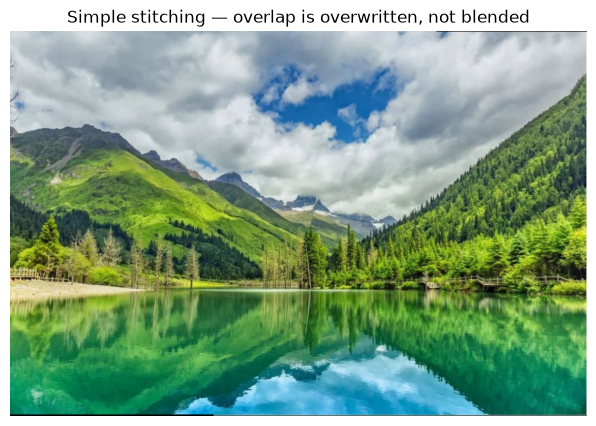

In [94]:
# Include negative transformed coordinates by translating both images onto a canvas.
h1, w1 = image1.shape[:2]
h2, w2 = image2.shape[:2]
corners1 = np.float32([[0, 0], [w1, 0], [w1, h1], [0, h1]]).reshape(-1, 1, 2)
corners2 = np.float32([[0, 0], [w2, 0], [w2, h2], [0, h2]]).reshape(-1, 1, 2)
projected = cv2.perspectiveTransform(corners2, M)
all_corners = np.concatenate([corners1, projected], axis=0).reshape(-1, 2)
if not np.isfinite(all_corners).all():
    raise ValueError("Unstable homography. Inspect the matches.")
xmin, ymin = np.floor(all_corners.min(axis=0)).astype(int)
xmax, ymax = np.ceil(all_corners.max(axis=0)).astype(int)
canvas_w, canvas_h = int(xmax - xmin), int(ymax - ymin)
if canvas_w <= 0 or canvas_h <= 0 or canvas_w * canvas_h > 30_000_000:
    raise ValueError("Unreasonable canvas size. Inspect H or resize the input images.")
translation = np.array([[1, 0, -xmin], [0, 1, -ymin], [0, 0, 1]], dtype=np.float64)
stitched_image = cv2.warpPerspective(image2, translation @ M, (canvas_w, canvas_h))
x0, y0 = int(-xmin), int(-ymin)
stitched_image[y0:y0+h1, x0:x0+w1] = image1
show_bgr(stitched_image, "Simple stitching — overlap is overwritten, not blended")


### 2.6 Perspective Transformation

Four non-collinear point pairs define a planar perspective transform.
The coordinates below illustrate the API; they are not measured corners of
a real document in this photograph. Replace them with actual corresponding
corners before calling the result a rectified object. Keep point order consistent.

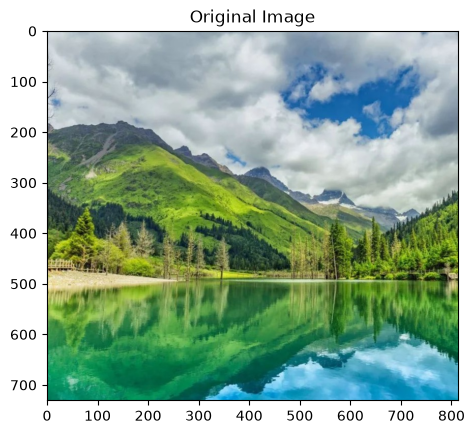

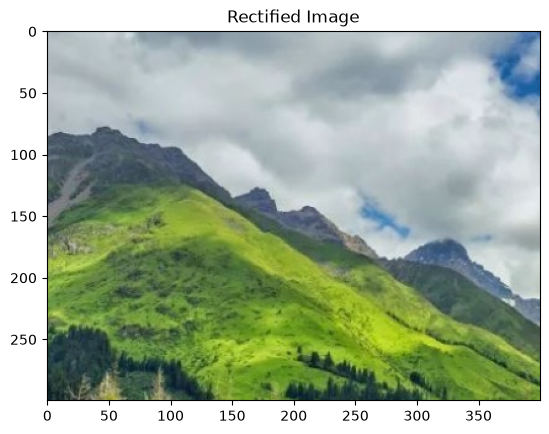

In [95]:
# Import necessary libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
image_path = './stitch_images/1.jpeg'
image = cv2.imread(image_path)

# Display the original image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.show()

# Define the points for perspective transformation
# These points should be selected based on the corners of the area you want to rectify
# For example, if you are rectifying a document, these would be the document's corners
points_src = np.float32([[100, 100], [500, 100], [100, 400], [500, 400]])
points_dst = np.float32([[0, 0], [400, 0], [0, 300], [400, 300]])

# Compute the perspective transform matrix
matrix = cv2.getPerspectiveTransform(points_src, points_dst)

# Perform the perspective transformation
rectified_image = cv2.warpPerspective(image, matrix, (400, 300))

# Display the rectified image
plt.imshow(cv2.cvtColor(rectified_image, cv2.COLOR_BGR2RGB))
plt.title('Rectified Image')
plt.show()

In [96]:
# The current report uses students' own photographs.
print("Lab report: https://romi-lab.github.io/python_opencv/index.html#lab-report-content")
print("Follow the current Q1-Q7 instructions and use your own photographs.")


Lab report: https://romi-lab.github.io/python_opencv/index.html#lab-report-content
Follow the current Q1-Q7 instructions and use your own photographs.
